<a id='section_id0'></a>
# Data Programming Essentials *with Python*

## Part 6: Modeling 5 : Tree-based Approaches

<font color="#740202">**Table of contents:**

|No.|Topic||No.|Topic||No.|Topic|
|:------|:------||:------|:------||:------|:------|
|1.|[Introduction and libraries](#section_id1)||2.|[Decision Tree Regressor](#section_id2)||3.|[Decision Tree Classifer](#section_id3)  |
|4.|[Ensembles for regression](#section_id4)  ||5.|[Ensembles for classification](#section_id5)  ||6.|[References](#section_id6)  |

***

<a id='section_id1'></a>
### <span style="background-color:#B0E0E6">Introduction, libraries, and additional tools</span>

* Using Decision Trees is another non-parametric approach, and it can be applied for both continuous outcomes (regression) and categorical outcomes (classification).
* [SciKit's documentation on Decision Trees](https://scikit-learn.org/stable/modules/tree.html) is very detailed and shows many parameters than can be used.
* We do need additional software to visualize the trees.

In [1]:
#loading our usual libraries

#pandas and numpy
import pandas as pd
import numpy as np

#Scikit stuff
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, \
                            BaggingClassifier, BaggingRegressor, \
                            GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, KFold, cross_validate, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, \
                            classification_report, precision_score, \
                            accuracy_score, roc_curve, roc_auc_score
import scikitplot as skplt

#dmba stuff
from dmba import regressionSummary, exhaustive_search
from dmba import adjusted_r2_score, AIC_score, BIC_score
from dmba import classificationSummary, gainsChart, liftChart, plotDecisionTree

# visualization and tuning the aesthetics
import matplotlib.pylab as plt
import seaborn as sns
%matplotlib inline
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2,'font.family': [u'times']})
plt.style.use('seaborn-whitegrid')
plt.rc('text', usetex = False)
plt.rc('font', family = 'serif')
plt.rc('xtick', labelsize = 10) 
plt.rc('ytick', labelsize = 10) 
plt.rc('font', size = 12) 
plt.rc('figure', figsize = (6, 5))

no display found. Using non-interactive Agg backend


In [2]:
#for plotting decision trees
import pydotplus as pplus
import graphviz
from IPython.display import Image
from six import StringIO
# if not found: ! pip install six

#for modeling with decision trees
from sklearn.tree import export_graphviz

In [3]:
# sometimes, the following is also needed to get the visualization to work
# Here, we get the path variable of the graphviz package installed in your machine.
import os
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [4]:
#This function helps with drawing decision trees using the pydotplus and graphviz libraries
def print_tree(estimator, features, class_names=None, filled=True):
    tree = estimator
    names = features
    color = filled
    classn = class_names
    
    dot_data = StringIO()
    export_graphviz(estimator, out_file=dot_data, feature_names=features,\
                    class_names=classn, filled=filled)
    graph = pplus.graph_from_dot_data(dot_data.getvalue())
    return(graph)

<div style="text-align: right"> <a href='#section_id0'>Back to top of Notebook</a></div>

<a id='section_id2'></a>
### <span style="background-color:#B0E0E6">Regression Trees</span>
* check and explore dataset first

|Variable|Description|
|:------|:------|
|sleeping|sleep hours on an average shcool night: 1=<4 hrs, 2=5 hrs, 3=6 hrs, 4=7 hrs, 5=8 hrs, 6=9 hrs, 7= >=10 hrs|
|sex|1=Female, 2=Male|
|race|1=White, 2=Black or African American, 3=Hispanic/Latino, 4=All other races|
|sexharass|sexual harassment during the past 12 months: 1=0 times, 2=1 time, 3=2 or 3 times, 4=4 or 5 times, 5=6 or more times|
|smoking|smoke cigarettes during the past 30 days: 1=0 days, 2=1 or 2 days, 3=3 to 5 days, 4= 6 to 9 days, 5=10 to 19 days, 6=20 to 29 days, 7=all 30 days|
|vegetables|eating other vegetables(do not count green salad, potatoes, or carrots) during the past 7 days: 1=0 times, 2=1 to 3 times, 3=4 to 6 times, 4=1 time/day, 5=2 times/day, 6=3 times/day, 7=>= 4 times/day|
|soda|drinking soda or pop during past 7 days: 1= 0 times, 2=1 to 3 times, 3=4 to 6 times, 4=1 time/day, 5=2 times/day, 6=3 times/day, 7=>=4 times/day |
|breakfast|days of eating breakfast per week: 1=0 day, 2=1 day, 3=2 days, 4=3 days, 5= 4 days, 6=5 days, 7=6 days, 8= 7 days|
|computer|hours of playing computer games or something that is not school work per day: 1=0 hrs, 2=<1 hr, 3=1 hr, 4=2 hrs, 5=3 hrs, 6=4 hrs, 7=>=5 hrs|

In [5]:
df1 = pd.read_csv('sleeping.csv')

In [6]:
df1.head(3)

,sleeping,sex,race,sexharass,smoking,vegetables,soda,breakfast,computer
0,1,2,4,4,4,3,2,3,3
1,1,2,3,1,1,2,1,1,2
2,1,2,4,1,1,1,1,1,1


In [37]:
# First, define the X (predictor/independent) and the Y (predicted/dependent) variables:
# SciKit doesn't work with Pandas dataframes, so we just need the matrix of values.
X = df1[['sex', 'race', 'sexharass', 'smoking', 'vegetables', 'soda', 'breakfast', 'computer']].values
Y = df1.sleeping

In [38]:
# Second, split the data into training and test portions:
# I am using 25% of data for testing and 75% for training.
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=7)
print(X_train.shape, Y_train.shape)
print(X_test.shape, Y_test.shape)

(27165, 8) (27165,)
(9055, 8) (9055,)


In [39]:
# Third, select the modeling approach for fitting: Decision Tree regression
DTsalesreg=DecisionTreeRegressor(random_state=23)

In [40]:
# Fit the model on training data
# Since we are using the training portion of the data, we are now "training" our model.
DTsalesreg.fit(X_train, Y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=23, splitter='best')

We can visualize the Decision Tree as following:

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0565421 to fit



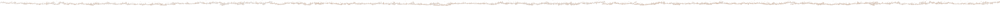

In [41]:
DTRgraph = print_tree(DTsalesreg, features=['sex', 'race', 'sexharass', 'smoking', 'vegetables', 'soda', 'breakfast', 'computer'])
Image(DTRgraph.create_png())

You can import the image and have a look at its detail. The dataset is partitioned in every other way, all of which leads to a scenario of overfitting as we'll see below.

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.100885 to fit



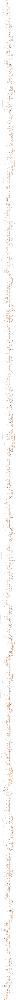

In [251]:
#alternative plotting using the utility from the DMBA book:
plotDecisionTree(DTsalesreg, feature_names=['sex', 'race', 'sexharass', 'smoking', 'vegetables', 'soda', 'breakfast', 'computer'], rotate=True)

In [42]:
# Fourth, get the predicted values and evaluate the training:
DT_predictions_tr=DTsalesreg.predict(X_train) # predictions for training set

In [43]:
# How good is this prediction in training?
np.sqrt(np.square(DT_predictions_tr-Y_train).mean()) #RMSE calculation

0.9894888028234693

In [44]:
regressionSummary(Y_train, DT_predictions_tr)


Regression statistics

                      Mean Error (ME) : 0.0000
       Root Mean Squared Error (RMSE) : 0.9895
            Mean Absolute Error (MAE) : 0.6675
          Mean Percentage Error (MPE) : -13.0478
Mean Absolute Percentage Error (MAPE) : 26.8670


<Mark>Interpretation:</Mark> RMSE is 0.99, let's find more and see if the model is overfitting.

<Mark>Note:</Mark> The features of the [cross_validate() function](https://scikit-learn.org/stable/modules/cross_validation.html#cross-validation-and-model-selection) are quite extensive. Several ways of splitting the data are possible. Here, we are just doing a basic K-fold split (k=3 in our example), and store the resulting MSE values in the scores_mse_DT array. Note that the scoring algorithm returns MSE as negative values becuase lowest MSE is better.

In [45]:
# How good is the model if subjected to variations in the training sample?
cvparam = KFold(3, random_state=13)
scores_mse_DT =  cross_validate(DTsalesreg, X_train, Y_train, \
                                cv=cvparam, scoring='neg_mean_squared_error')

C:\Users\edwar\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [46]:
scores_mse_DT['test_score']

array([-2.78734021, -2.81003495, -2.8183409 ])

<Mark>Note:</Mark>The negative sign is becuase the parameter used by the algorithm is "neg_mean_squared_error", to indicate that a lower value of MSE is better. I multipled by -1 to get the actual MSE.

In [47]:
np.sqrt(scores_mse_DT['test_score'].mean()*-1)

1.6748846784745455

<Mark>Interpretation:</Mark> Once we induce some variation in the training sample, by doing a 3-fold split, the accuracy of our decision tree-based prediction has gone down. This is an example of how prediction models suffer from the "variance" problem. <br> 
Here, we see that the cross-validation reveals that the model is off by about 1.67 hours.

In [48]:
# Fifth, how good is the out-of-training-sample (i.e., the test) prediction of the trained model?
DT_predictions_tt=DTsalesreg.predict(X_test)
regressionSummary(Y_test, DT_predictions_tt)
#np.sqrt(np.square(DT_predictions_tt-Y_test).mean())


Regression statistics

                      Mean Error (ME) : -0.0024
       Root Mean Squared Error (RMSE) : 1.6388
            Mean Absolute Error (MAE) : 1.2731
          Mean Percentage Error (MPE) : -24.3671
Mean Absolute Percentage Error (MAPE) : 52.2835


<Mark>Interpretation:</Mark> Our model is deviant from the actual values by about 1.64 sleeping hours, on average when using the test data. 
Is that good enough? That is indeed a subjective decision, depending on the business context.

#### Re-Training the Decision Tree regression model

Suppose, you decided to re-train the model. That is, you wanted to try another decision tree, say by limiting the number of branches and leaf nodes.

In [49]:
# Decide the parameters for the new Decision Tree: we limit the decision depth to 3.
DTsalesreg2=DecisionTreeRegressor(max_depth=5, random_state=23)

In [50]:
# Fit the model on training data
# Since we are using the training portion of the data, we are now "training" our model.
DTsalesreg2.fit(X_train, Y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=5,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=23, splitter='best')

We can visualize the Decision Tree as following:

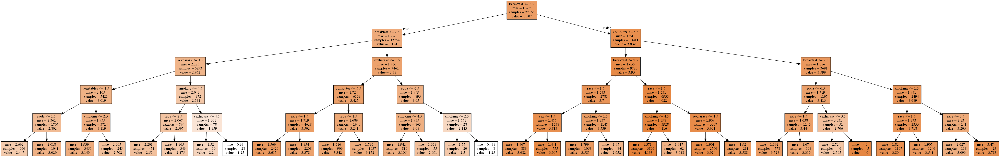

In [263]:
DTRgraph = print_tree(DTsalesreg2, features=['sex', 'race', 'sexharass', 'smoking', 'vegetables', 'soda', 'breakfast', 'computer'])
Image(DTRgraph.create_png())

We can import the image, if you wish to use it in your presentation.<br>
With the new model, we see that the dataset is partitioned in a much limited way as compared to the original decision tree. This should mitigate overfitting in training. 

In [51]:
# Now, get the predicted values and evaluate the training of the new decision tree:
DT2_predictions_tr=DTsalesreg2.predict(X_train) # predictions for training set

In [52]:
# How good is this prediction in training?
#np.sqrt(np.square(DT2_predictions_tr-Y_train).mean()) #RMSE calculation
regressionSummary(Y_train, DT2_predictions_tr)


Regression statistics

                      Mean Error (ME) : 0.0000
       Root Mean Squared Error (RMSE) : 1.3302
            Mean Absolute Error (MAE) : 1.0688
          Mean Percentage Error (MPE) : -24.9462
Mean Absolute Percentage Error (MAPE) : 46.3985


<Mark>Interpretation:</Mark> RMSE is decreased now. Here, we see that the training model leads to an error in prediction of decreases to 1.33 hours, on average. 

In [53]:
# How good is the model if subjected to variations in the training sample?
cvparam = KFold(3, random_state=13)
scores_mse_DT2 =  cross_validate(DTsalesreg2, X_train, Y_train, \
                                 cv=cvparam, scoring='neg_mean_squared_error')

C:\Users\edwar\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [54]:
scores_mse_DT2['test_score']

array([-1.76760035, -1.81743602, -1.80204905])

In [55]:
np.sqrt(scores_mse_DT2['test_score'].mean()*-1)

1.3400354995235286

<Mark>Interpretation:</Mark> Once we induce some variation in the training sample, by doing a 3-fold split, the accuracy of our decision tree-based prediction has slightly gone down. This is an example of how prediction models suffer from the "variance" problem. <br> 
Here, we see that the cross-validation reveals that the model is off by about 1.34 hours.

In [56]:
# Fifth, how good is the out-of-training-sample (i.e., the test) prediction of the trained model?
DT2_predictions_tt=DTsalesreg2.predict(X_test)
regressionSummary(Y_test, DT2_predictions_tt)
#np.sqrt(np.square(DT2_predictions_tt-Y_test).mean())


Regression statistics

                      Mean Error (ME) : 0.0028
       Root Mean Squared Error (RMSE) : 1.3329
            Mean Absolute Error (MAE) : 1.0711
          Mean Percentage Error (MPE) : -24.2431
Mean Absolute Percentage Error (MAPE) : 45.8671


<Mark>Interpretation:</Mark> Our model is deviant from the actual values by about 1.33 hours, on average when using the test data. 
Is that good enough? That is indeed a subjective decision, depending on the business context.

<div style="text-align: right"> <a href='#section_id0'>Back to top of Notebook</a></div>

<a id='section_id3'></a>
### <span style="background-color:#B0E0E6">Classification Trees</span>


In [7]:
df1.columns

Index(['sleeping', 'sex', 'race', 'sexharass', 'smoking', 'vegetables', 'soda',
       'breakfast', 'computer'],
      dtype='object')

In [8]:
# inserting a health_category column
df1['sleepcat']=pd.cut(df1['sleeping'], bins=[0,4,8], labels=['short', 'long']) # 0 = short, 1 =long
df1.head(6)

,sleeping,sex,race,sexharass,smoking,vegetables,soda,breakfast,computer,sleepcat
0,1,2,4,4,4,3,2,3,3,short
1,1,2,3,1,1,2,1,1,2,short
2,1,2,4,1,1,1,1,1,1,short
3,3,2,4,1,1,3,5,5,4,short
4,3,2,4,1,6,2,6,5,7,short
5,5,2,4,1,1,5,2,4,5,long


In [10]:
healthdummy=pd.get_dummies(df1['sleepcat'])
df1['sleepcatlong']=healthdummy['long']
yvar= df1.sleepcatlong.astype('float64')
Xvar = df1.drop(['sleeping', 'sleepcat','sleepcatlong'], axis=1).astype('float64')

In [11]:
features=df1.drop(['sleeping', 'sleepcat','sleepcatlong'], axis=1).columns

In [12]:
# Split the data into training and test portions:

X2_train, X2_test, Y2_train, Y2_test = train_test_split(Xvar, yvar, test_size=0.25, random_state=7)
print(X2_train.shape, Y2_train.shape)
print(X2_test.shape, Y2_test.shape)

(27165, 8) (27165,)
(9055, 8) (9055,)


In [13]:
# Select the model approach for fitting: Decision Tree Classifier

DT_insurance = DecisionTreeClassifier(max_depth=None, max_leaf_nodes=None, \
                                      max_features=None, random_state=23)

Interested in more parameter? Refer to the [DecisionTreeClassifer's documentation](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier)

In [14]:
# Fit the decision tree classifier model with training data:
DT_insurance.fit(X2_train, Y2_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=23, splitter='best')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.117907 to fit



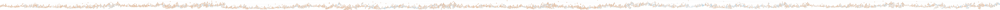

In [15]:
plotDecisionTree(DT_insurance, feature_names=features)

In [16]:
# Get the prediction of the decision tree classifier training
DT_prediction_ctr=DT_insurance.predict(X2_train)

In [17]:
# Evaluate how good the decision tree classification of training data is:
cm_DTC = confusion_matrix(Y2_train, DT_prediction_ctr)
print("Confusion Matrix:\n", cm_DTC)
print("\n")
print("Classification Report:\n",classification_report(Y2_train, DT_prediction_ctr))

Confusion Matrix:
 [[19747   650]
 [ 4080  2688]]


Classification Report:
               precision    recall  f1-score   support

         0.0       0.83      0.97      0.89     20397
         1.0       0.81      0.40      0.53      6768

    accuracy                           0.83     27165
   macro avg       0.82      0.68      0.71     27165
weighted avg       0.82      0.83      0.80     27165



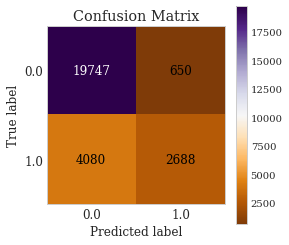

In [18]:
skplt.metrics.plot_confusion_matrix(Y2_train, DT_prediction_ctr, figsize=(4,4), cmap="PuOr")

<Mark>Interpretation:</Mark> We see that the model resulted in 83% accuracy of classifying sleeping duration. The classifier missed value is 4080  and misclassified value is 650. <br> 


In [19]:
# Evaluate how good the decision tree classification is, after cross-validation:
cvparam = KFold(3, random_state=13)
scores_accuracy_DT =  cross_val_score(DT_insurance, X2_train, Y2_train, \
                                      cv=cvparam, scoring='accuracy')
scores_accuracy_DT.mean() #average training accuracy

C:\Users\edwar\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


0.6872814283084852

<Mark>Interpretation:</Mark> Once we induce some variation in the training sample, by doing a 3-fold split, the accuracy of our decision tree-based prediction has gone down. This is an example of how overfitted prediction models suffer from the "variance" problem. <br> 
Here, we see that the cross-validation reveals the model's accuracy to be about 69%, lower than the earlier 83%.

How does the model do for out-of-training-sample prediction? Let us find out by using the test sample. 

In [23]:
# Get the prediction of the decision tree classifier for test sample
DT_prediction_ctt=DT_insurance.predict(X2_test)

In [24]:
# Evaluate how good the decision tree classification of testing data is:
cm_DTC_tt = confusion_matrix(Y2_test, DT_prediction_ctt)
print("Confusion Matrix:\n", cm_DTC_tt)
print("\n")
print("Classification Report:\n",classification_report(Y2_test, DT_prediction_ctt))

Confusion Matrix:
 [[5899  936]
 [1865  355]]


Classification Report:
               precision    recall  f1-score   support

         0.0       0.76      0.86      0.81      6835
         1.0       0.27      0.16      0.20      2220

    accuracy                           0.69      9055
   macro avg       0.52      0.51      0.51      9055
weighted avg       0.64      0.69      0.66      9055



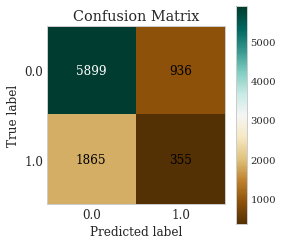

In [25]:
skplt.metrics.plot_confusion_matrix(Y2_test, DT_prediction_ctt, figsize=(4,4), cmap="BrBG")

<Mark>Interpretation:</Mark> Is the above model's accuracy better than a naive prediction?
A naive prediction is to say that "no body would have short sleep duration".

In [26]:
1-df1.sleepcatlong.mean()

0.7518498067366096

<Mark>Takeaway:</Mark> The naive prediction yields lower accuracy than that of classification tree model. Our Decision Tree classifier is a little better.

Next, we consider refinements to the Decision Tree approach by trying to build many trees and then grouping them together. This is to tackle the "variance" issue we noticed before. 
***

<div style="text-align: right"> <a href='#section_id0'>Back to top of Notebook</a></div>

<a id='section_id4'></a>
### <span style="background-color:#B0E0E6">Ensembles: Bagging, Random Forest, and Boosting</span>
* Averaging a set of observations reduces variance. Hence, a natural way to reduce the variance and to increase the prediction accuracy of a statistical/machine learning method is to take many training sets from the population, build a separate prediction model using each training set, and then average the resulting predictions.
* In the classification situation, there are a few possible approaches, but the simplest is as follows. For a given test observation, we can record the "class" predicted by each of the many decision trees, and take a majority vote: the overall prediction is the most commonly occurring majority vote class among the different predictions.
* **Bagging**, is a general-purpose bootstrap aggregation procedure for reducing the variance of a statistical/machine learning method by resampling the dataset. 
* **Random Forest**: As in bagging, we build a number of decision trees on bootstrapped training samples. But when building these decision trees, each time a split in a tree is considered, only a random sample of m predictors (specified) is chosen as split candidates from the full set of predictors.
* **Boosting**: We grow the trees slowly, by specifically considering the misclassified or residuals.

<Mark>Reference:</Mark>The above are called "ensemble" methods becuase we combine predictions from several base decision trees. You can read more about these [ensemble approaches in the SciKit-Learn documentation](https://scikit-learn.org/stable/modules/ensemble.html). <br>
* The functions we will be usig are:
    * RandomForestRegressor
    * RandomForestClassifier
    * GradientBoostingRegressor
    * GradientBoostingClassifier

<div style="text-align: right"> <a href='#section_id0'>Back to top of Notebook</a></div>

### <span style="background-color:#B0E0E6">Ensembles and Decision Tree Regressions</span>


In [57]:
# Decide the parameters for the new Decision Tree with ensemble: bagging
DTsalesreg_bag=RandomForestRegressor(max_features=8, random_state=23)

In the above specification, I used 8 features becuase we have 'sex', 'race', 'sexharass', 'breakfast', 'smoking', 'vegetables', 'soda', 'computer' as the eight predictors in the dataset.
* Bagging involves using all features to build the decision trees
* Random Forest involves using only a subset of features to build the trees

In [58]:
# Decide the parameters for the new Decision Tree with ensemble: random forest
DTsalesreg_RF=RandomForestRegressor(max_features=5, random_state=23)

Boosting involves building many trees and provides several "tuning" parameters such as the rate of learning:

In [59]:
# Decide the parameters for the new Decision Tree with ensemble: Boosting
DTsalesreg_boost=GradientBoostingRegressor(n_estimators=500, learning_rate=0.01, random_state=23) #500 trees

In [60]:
# Fit the bagging model on training data
# Since we are using the training portion of the data, we are now "training" our model.
DTsalesreg_bag.fit(X_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features=8, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=23, verbose=0, warm_start=False)

In [61]:
# Fit the random forest model on training data
# Since we are using the training portion of the data, we are now "training" our model.
DTsalesreg_RF.fit(X_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features=5, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=23, verbose=0, warm_start=False)

In [62]:
# Fit the boosting model on training data
# Since we are using the training portion of the data, we are now "training" our model.
DTsalesreg_boost.fit(X_train, Y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.01, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=500,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=23, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [63]:
# Now, get the predicted values and evaluate the training of the new decision tree models:
DTbag_predictions_tr=DTsalesreg_bag.predict(X_train) # predictions for training set

In [64]:
# Now, get the predicted values and evaluate the training of the new decision tree models:
DTRF_predictions_tr=DTsalesreg_RF.predict(X_train) # predictions for training set

In [65]:
# Now, get the predicted values and evaluate the training of the new decision tree models:
DTboost_predictions_tr=DTsalesreg_boost.predict(X_train) # predictions for training set

In [66]:
# How good is this prediction of bagging in training?
#np.sqrt(np.square(DTbag_predictions_tr-Y_train).mean()) #RMSE calculation
regressionSummary(Y_train, DTbag_predictions_tr)


Regression statistics

                      Mean Error (ME) : -0.0011
       Root Mean Squared Error (RMSE) : 1.0333
            Mean Absolute Error (MAE) : 0.7916
          Mean Percentage Error (MPE) : -16.3331
Mean Absolute Percentage Error (MAPE) : 32.6992


In [67]:
# How good is this prediction of random forest in training?
#np.sqrt(np.square(DTRF_predictions_tr-Y_train).mean()) #RMSE calculation
regressionSummary(Y_train, DTRF_predictions_tr)


Regression statistics

                      Mean Error (ME) : -0.0003
       Root Mean Squared Error (RMSE) : 1.0322
            Mean Absolute Error (MAE) : 0.7902
          Mean Percentage Error (MPE) : -16.2777
Mean Absolute Percentage Error (MAPE) : 32.6261


In [68]:
# How good is this prediction of boosting in training?
#np.sqrt(np.square(DTboost_predictions_tr-Y_train).mean()) #RMSE calculation
regressionSummary(Y_train,DTboost_predictions_tr)


Regression statistics

                      Mean Error (ME) : -0.0000
       Root Mean Squared Error (RMSE) : 1.3228
            Mean Absolute Error (MAE) : 1.0620
          Mean Percentage Error (MPE) : -24.9700
Mean Absolute Percentage Error (MAPE) : 46.2258


<Mark>Interpretation:</Mark> We can see that the ensemble models are pretty good at prediction. RMSE is low, and we don't have to worry about overfitting becuase we collated a bunch of trees, not using just one decision tree. <br> 
Here, we see that both the bagging and random forest training models lead to an lowest error in prediction of 1.03, on average. Boosting results in the RMSE of about 1.32. Random forest model performs a little bit better.

In [71]:
# How good is the random forest model if subjected to variations in the training sample?
cvparam = KFold(3, random_state=13)
scores_mse_DTRF = cross_validate(DTsalesreg_RF, X_train, Y_train, cv=cvparam, \
                                  scoring='neg_mean_squared_error')

C:\Users\edwar\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [72]:
scores_mse_DTRF['test_score']

array([-2.08467856, -2.12831032, -2.11703982])

<Mark>Note:</Mark>The negative sign is becuase the parameter used by the algorithm is "neg_mean_squared_error", to indicate that a lower value of MSE is better. I multipled by -1 to get the actual MSE.

In [73]:
np.sqrt(scores_mse_DTRF['test_score'].mean()*-1)

1.4525871973513775

<Mark>Interpretation:</Mark> Here, we see that the cross-validation reveals that the random forest model is off by about 1.45 hours.

In [74]:
# Fifth, how good is the out-of-training-sample (i.e., the test) prediction of the 
#trained random forest model?

DTsalesreg_RF_tt=DTsalesreg_RF.predict(X_test)
#np.sqrt(np.square(DTsalesreg_bag_tt-Y_test).mean())
regressionSummary(Y_test,DTsalesreg_RF_tt)


Regression statistics

                      Mean Error (ME) : -0.0040
       Root Mean Squared Error (RMSE) : 1.4447
            Mean Absolute Error (MAE) : 1.1511
          Mean Percentage Error (MPE) : -24.3072
Mean Absolute Percentage Error (MAPE) : 48.1606


<Mark>Interpretation:</Mark> Our testing model is deviant from the actual values by about 1.4 hours when using random forest model, on average.
Is that good enough? That is indeed a subjective decision, depending on the business context.

Another useful feature of ensembles is that we can derive the importance of different variables in influencing the prediction. 

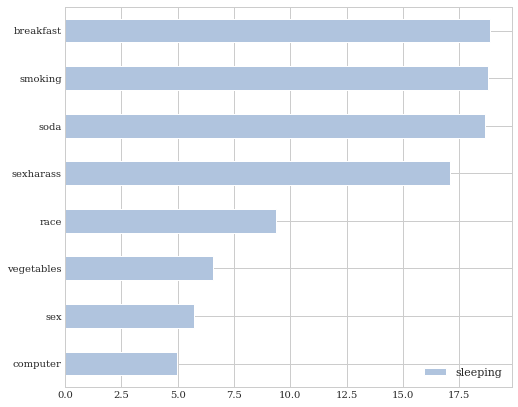

In [77]:
Importance = pd.DataFrame({'sleeping':DTsalesreg_RF.feature_importances_*100}, \
                          index=['sex', 'race', 'computer', 'vegetables', 'soda', 'breakfast', 'smoking', 'sexharass'])
Importance.sort_values('sleeping', axis=0, ascending=True).plot(kind='barh', color='lightsteelblue', )
plt.gcf().set_size_inches(8, 7)

* We can see that eating breakfast, smoking cigarettes, and drinking soda are the three most important variables. 
* gender and playing with computer are the two least important variables.


Other named colors like "lightsteelblue" in matplotlib [can be found here](https://matplotlib.org/3.1.0/gallery/color/named_colors.html)

<div style="text-align: right"> <a href='#section_id0'>Back to top of Notebook</a></div>

<a id='section_id5'></a>
### <span style="background-color:#B0E0E6">Ensembles and Decision Tree Classifiers</span>


In [78]:
df1.head(3)

,sleeping,sex,race,sexharass,smoking,vegetables,soda,breakfast,computer,sleepcat,sleepcatlong
0,1,2,4,4,4,3,2,3,3,short,0
1,1,2,3,1,1,2,1,1,2,short,0
2,1,2,4,1,1,1,1,1,1,short,0


In [79]:
df1.columns

Index(['sleeping', 'sex', 'race', 'sexharass', 'smoking', 'vegetables', 'soda',
       'breakfast', 'computer', 'sleepcat', 'sleepcatlong'],
      dtype='object')

In [80]:
df1.shape

(36220, 11)

In [81]:
features=df1.drop(['sleeping','sleepcat', 'sleepcatlong'], axis=1).columns

In [82]:
features #these are the predictor variables

Index(['sex', 'race', 'sexharass', 'smoking', 'vegetables', 'soda',
       'breakfast', 'computer'],
      dtype='object')

In [83]:
len(features) # there are 12 predictors

8

In [85]:
# Select the model approaches for fitting:
#Bagging
DT_insurance_bag = RandomForestClassifier(max_features=8, random_state=23)
#Random Forest
DT_insurance_RF = RandomForestClassifier(max_features=5, random_state=23)
#Boosting
DT_insurance_boost = GradientBoostingClassifier(n_estimators=500, learning_rate=0.01, random_state=23)

In [86]:
# Fit the decision tree bagging classifier models with training data:
DT_insurance_bag.fit(X2_train, Y2_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features=8,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=23, verbose=0,
                       warm_start=False)

In [87]:
# Fit the decision tree random forest classifier models with training data:
DT_insurance_RF.fit(X2_train, Y2_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=23, verbose=0,
                       warm_start=False)

In [88]:
# Fit the decision tree boosting classifier models with training data:
DT_insurance_boost.fit(X2_train, Y2_train)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.01, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=500,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=23, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [89]:
# Get the predictions of the decision tree classifiers on testing data
DTbag_prediction_ctt=DT_insurance_bag.predict(X2_test)
DTRF_prediction_ctt=DT_insurance_RF.predict(X2_test)
DTboost_prediction_ctt=DT_insurance_boost.predict(X2_test)

In [90]:
# Evaluate how good the bagging classification is:
cm_DTC_bag = confusion_matrix(Y2_test, DTbag_prediction_ctt)
print("Confusion Matrix:\n",cm_DTC_bag)
print("\n")
print("Classification Report:\n",classification_report(Y2_test, DTbag_prediction_ctt))

Confusion Matrix:
 [[6027  808]
 [1892  328]]


Classification Report:
               precision    recall  f1-score   support

         0.0       0.76      0.88      0.82      6835
         1.0       0.29      0.15      0.20      2220

    accuracy                           0.70      9055
   macro avg       0.52      0.51      0.51      9055
weighted avg       0.65      0.70      0.66      9055



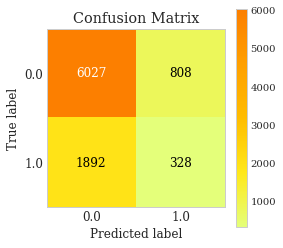

In [91]:
skplt.metrics.plot_confusion_matrix(Y2_test, DTbag_prediction_ctt, figsize=(4,4), cmap="Wistia")

In [92]:
# Evaluate how good the random forest classification is:
cm_DTC_RF = confusion_matrix(Y2_test, DTRF_prediction_ctt)
print("Confusion Matrix:\n",cm_DTC_RF)
print("\n")
print("Classification Report:\n",classification_report(Y2_test, DTRF_prediction_ctt))

Confusion Matrix:
 [[6057  778]
 [1903  317]]


Classification Report:
               precision    recall  f1-score   support

         0.0       0.76      0.89      0.82      6835
         1.0       0.29      0.14      0.19      2220

    accuracy                           0.70      9055
   macro avg       0.53      0.51      0.51      9055
weighted avg       0.65      0.70      0.66      9055



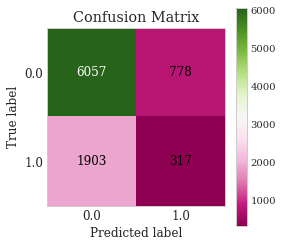

In [93]:
skplt.metrics.plot_confusion_matrix(Y2_test, DTRF_prediction_ctt, figsize=(4,4), cmap="PiYG")

In [94]:
# Evaluate how good the boosting classification is:
cm_DTC_boost = confusion_matrix(Y2_test, DTboost_prediction_ctt)
print("Confusion Matrix:\n",cm_DTC_boost)
print("\n")
print("Classification Report:\n",classification_report(Y2_test, DTboost_prediction_ctt))

Confusion Matrix:
 [[6835    0]
 [2220    0]]


Classification Report:
               precision    recall  f1-score   support

         0.0       0.75      1.00      0.86      6835
         1.0       0.00      0.00      0.00      2220

    accuracy                           0.75      9055
   macro avg       0.38      0.50      0.43      9055
weighted avg       0.57      0.75      0.65      9055



C:\Users\edwar\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


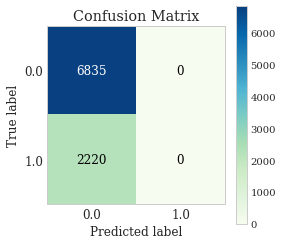

In [95]:
skplt.metrics.plot_confusion_matrix(Y2_test, DTboost_prediction_ctt, figsize=(4,4), cmap="GnBu")

<Mark>Interpretation:</Mark> We see that the models vary in their abilities and make different levels of type-1 and type-2 erros. <br>
* The bagging identified the most number of correct students having sufficient sleep (328), but misidentified 808 students as having sufficient sleep when they were not.
* The random forest model identified 317 students correctly, missed 1903, and wrongly identified 778 as having sufficient sleep.
* The boosting model identified none of students having sufficient sleep correctly.

Are these predictions better than a naive prediction? A naive prediction is to say that "no body would have sufficient sleep".

In [97]:
1-df1.sleepcatlong.mean()

0.7518498067366096

<Mark>Takeaway:</Mark> The naive prediction yields slightly higher accuracy than baggin and random forest models. Our Decision Tree classifiers are not good enough in this context.

Another useful feature of ensembles is that we can derive the importance of different variables in influencing the prediction. 

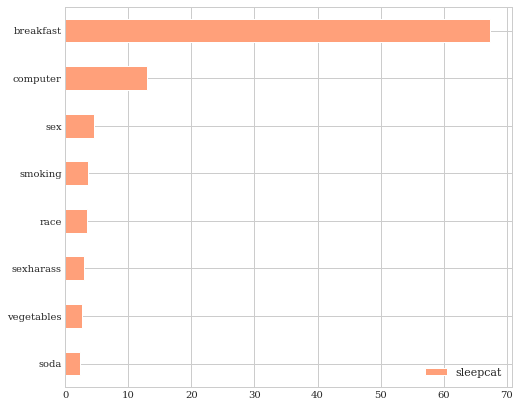

In [99]:
Importance = pd.DataFrame({'sleepcat':DT_insurance_boost.feature_importances_*100}, \
                          index=features)
Importance.sort_values('sleepcat', axis=0, ascending=True).plot(kind='barh', color='lightsalmon', )
plt.gcf().set_size_inches(8, 7)

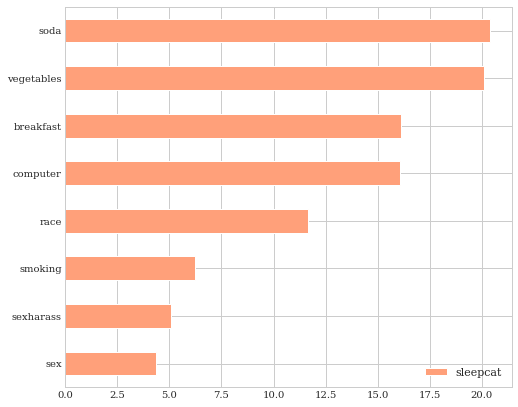

In [100]:
Importance = pd.DataFrame({'sleepcat':DT_insurance_RF.feature_importances_*100}, \
                          index=features)
Importance.sort_values('sleepcat', axis=0, ascending=True).plot(kind='barh', color='lightsalmon', )
plt.gcf().set_size_inches(8, 7)

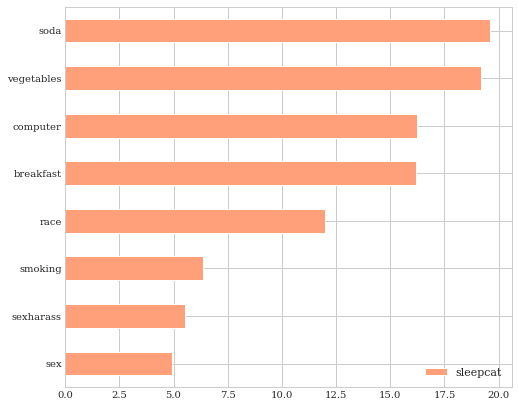

In [101]:
Importance = pd.DataFrame({'sleepcat':DT_insurance_bag.feature_importances_*100}, \
                          index=features)
Importance.sort_values('sleepcat', axis=0, ascending=True).plot(kind='barh', color='lightsalmon', )
plt.gcf().set_size_inches(8, 7)

* We can see that eating habits is the most important factor in all three classification tree models.


<a id='section_id6'></a>
### <span style="background-color:#B0E0E6">References:</span>
* There are many more packages for doing ensembles in Python. 
    * Checkout all the [ensemble methods in Scikit](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.ensemble)
    * [XGBoost](https://xgboost.readthedocs.io/en/latest/python/python_intro.html) is also very popular and powerful
* Chapter 9 of _Datamining for Business Analytics_. [Access through Pitt library](https://pitt.summon.serialssolutions.com/#!/search?bookMark=ePnHCXMw42JgAfZbU5khpymBDxSztADNrHEZgbYtA2tc0K0CXMBq3gRYkwA7SJwMSi6JJYkKueALERSATTUF6P2LxQqJoIM5QMcV8zCwpgGjI5WXgaWkqBRYcEq7uYY4e-iCDkeKhw50xAPTkpmJBejiIfyyKlhkYXM9QGVA95qYGQMA-383uA)
* Another book I like is: [Introduction to Statistical Learning](http://faculty.marshall.usc.edu/gareth-james/ISL/). The ISL book provides intuitive and "math-lite" explanations for many concepts. 
    * The ISL book uses R for lab exercises, but the concepts covered are independent of the programming language.
    * [The videos](https://www.dataschool.io/15-hours-of-expert-machine-learning-videos/) from the authors of the ISL book are a great resource.
    * Another book, [Elements of Statistical Learning](https://web.stanford.edu/~hastie/ElemStatLearn/), has more advanced treatment of the topics covered by ISL.

***

<div style="text-align: right"> <a href='#section_id0'>Back to top of Notebook</a></div>